# **Lab 2.1 Image Enhancement with Math Operation**
This lab consists of two main subparts: Image Pixel Adjustment using Linear Equations and Gamma Equations.

In [26]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.axes_grid1 import ImageGrid
import os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

Read an image using OpenCV (Use your own image).

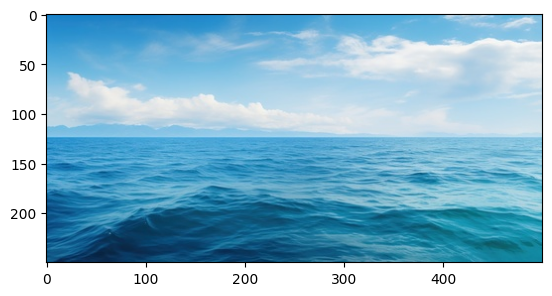

In [27]:
### START CODE HERE ###
img = cv2.imread('pic.jpg')

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

plt.imshow(img)
### END CODE HERE ###

## **Image Pixel Adjustment**

### Using Linear Equation
$$I_{new} = I \cdot a + b$$

Please perform at ***least 20 iterations*** with varying values of $a$ and $b$.
Assign the result of each iteration to an array.<br/>

In [28]:
### START CODE HERE ###
a = 0
b = 0
lin_result = []

for i in range(20):
    temp=((img)*((a+i)/9)+((b+i)/9))
    if np.any(temp>255):
        temp[temp>255] = 255
    lin_result.append(temp.astype(np.uint8))
    

### END CODE HERE ###

Plot the images in a grid as shown below. Using `ImageGrid`.
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical
- The reference output used 40 iterations.

![image-2.png](https://github.com/Digital-Image-Processing-Laboratory/image_processing-2024/blob/master/Lab2_Image-Enhancement/assets/1-1.png?raw=true)
</details>


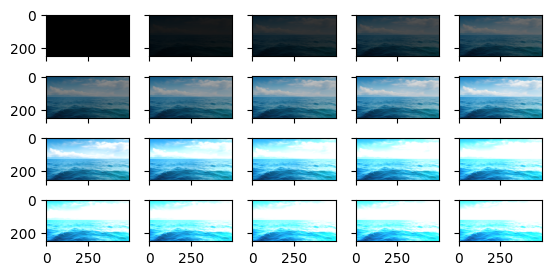

In [6]:
### START CODE HERE ###
fig = plt.figure()
grid = ImageGrid(fig,111,
                 nrows_ncols=(4,5),
                 axes_pad=0.2,
                 )

i=0
for axs in grid:
    axs.imshow(lin_result[i])
    i+=1

plt.show()
### END CODE HERE ###

If you code work properly, the cell below should run without error.

In [7]:
assert len(lin_result) >= 20, f"Expected more than or equal 20 iterations but got {len(lin_result)}"
for idx, result in enumerate(lin_result):
    assert result.shape == img.shape, f"Shape mismatch at index {idx}. Expected {img.shape} but got {result.shape}"
    assert result.dtype == np.uint8, f"Data type mismatch at index {idx}. Expected uint8 but got {result.dtype}"
    assert np.all((result >= 0) & (result <= 255)), f"Pixel value out of bounds at index {idx}"

Save the array of images to a video. Please complete the function below.

In [42]:
### START CODE HERE ###
def write_images_to_video(image_array, output_file, frame_rate=30):
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_file,fourcc, frame_rate,(image_array[0].shape[1], image_array[0].shape[0]))

    for temp_img in image_array:
        temp_img = cv2.cvtColor(temp_img,cv2.COLOR_RGB2BGR) # RGB-> BGR
        out.write(temp_img) # write แบบ BGR

    out.release()
### END CODE HERE ###

Use `write_images_to_video()` and save the result.

In [43]:
output_folder = "output"
os.makedirs(output_folder, exist_ok=True)

output_file =  os.path.join(output_folder, "output_linear.mp4")
write_images_to_video(lin_result,output_file)

Now use `matplotlib.animation` to display the animation from the images array.

In [45]:
%%capture
### START CODE HERE ###
fig, axs = plt.subplots()

lin_result_show = []
for temp in lin_result:
    lin_result_show.append([axs.imshow(temp.astype(np.uint8), animated=True)])

ani = animation.ArtistAnimation(fig, lin_result_show,interval=30)
### END CODE HERE ###

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![linear.gif](![<attachment:linear (2).gif>](https://github.com/Digital-Image-Processing-Laboratory/image_processing-2024/blob/master/Lab2_Image-Enhancement/assets/linear.gif?raw=true))

</details>

In [46]:
display(HTML(ani.to_jshtml()))

### Gamma Equation
$$I_{new} = I^{\gamma} \cdot a + b$$

Where $a$ is 1 and $b$ is 0. 
Please perform ***at least 20 iterations*** for 0 < $\gamma$ < 2 and another ***at least 20 iterations*** for $\gamma$ > 1
Assign the result of each iteration to an array.<br/>


In [24]:
### START CODE HERE ###
a = 1
b = 0
gamma = 0.1

gam_result = []

norm_img = img.copy().astype(float)/255

for i in range(20):
    temp=(norm_img**(gamma+(i/10)))*a+b
    # print(gamma+(i/10))
    temp *= 255
    if np.any(temp>255):
        temp[temp>255] = 255
    gam_result.append(temp.astype(np.uint8))


### END CODE HERE ###

Plot the images in a grid as shown below. Using `ImageGrid`.
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image-2.png](https://github.com/Digital-Image-Processing-Laboratory/image_processing-2024/blob/master/Lab2_Image-Enhancement/assets/1-2.png?raw=true)
</details>

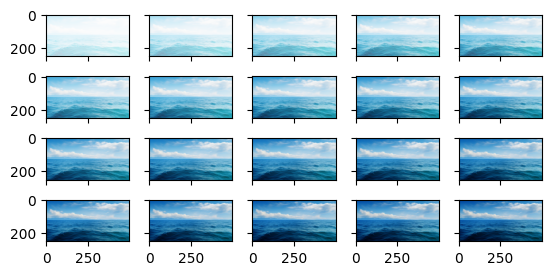

In [25]:
### START CODE HERE ###

fig = plt.figure()
grid = ImageGrid(fig,111,
                 nrows_ncols=(4,5),
                 axes_pad=0.2,
                 )

i=0
for axs in grid:
    axs.imshow(gam_result[i])
    i+=1



plt.show()
### END CODE HERE ###

In [14]:
assert len(gam_result) == 20, f"Expected {20} iterations but got {len(gam_result)}"
for idx, result in enumerate(gam_result):
    assert result.shape == img.shape, f"Shape mismatch at index {idx}. Expected {img.shape} but got {result.shape}"
    assert result.dtype == np.uint8, f"Data type mismatch at index {idx}. Expected uint8 but got {result.dtype}"
    assert np.all((result >= 0) & (result <= 255)), f"Pixel value out of bounds at index {idx}"

Use `write_images_to_video()` and save the result.

In [15]:
output_folder = "output"
os.makedirs(output_folder, exist_ok=True)

output_file =  os.path.join(output_folder, "output_gamma.mp4")
write_images_to_video(gam_result,output_file)

Now use `matplotlib.animation` to display the animation from the images array.

In [29]:
%%capture
### START CODE HERE ###
fig, axs = plt.subplots()

gam_result_show = []
for temp in gam_result:
    gam_result_show.append([axs.imshow(temp.astype(np.uint8), cmap='viridis', animated=True)])

ani = animation.ArtistAnimation(fig, gam_result_show,interval=30,)
### END CODE HERE ###

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![gamma2.gif](https://github.com/Digital-Image-Processing-Laboratory/image_processing-2024/blob/master/Lab2_Image-Enhancement/assets/gamma.gif?raw=true)

</details>

In [30]:
display(HTML(ani.to_jshtml()))

---

## **Questions**
1. If an image having over brightness or saturation, what would be possible solutions to enhance the image.
2. How can we make an image reverse intensity (black-to-white, white-to-black)? Explain the process

ตอบ
    1.
    2.